# Brain MRI Scans — Denoising Autoencoder

Medical imaging is one of the most impactful real-world applications of deep learning. MRI scanners, by their physical nature, introduce noise into images — and that noise can obscure subtle but clinically important features.

A denoising autoencoder learns to separate signal from noise. Trained on clean brain MRI scans, it builds an internal model of what a *real* brain scan looks like, then uses that knowledge to strip away noise and recover the clean underlying image.

This isn't just a classroom exercise — denoising autoencoders are actively used in radiology pipelines to enhance low-dose scan quality, reduce acquisition time, and improve diagnostic accuracy.

**Architecture:** Convolutional Denoising Autoencoder  
**Dataset:** Brain MRI Scans (Kaggle)  
**Input:** 128×128 grayscale MRI slices  
**Task:** Remove Gaussian noise → recover clean scan

## Setup & Installs

Run this cell first — it installs everything needed including the Kaggle API, scikit-learn, and scikit-image for evaluation metrics.

In [1]:
# Install all required packages
!pip install kaggle scikit-learn scikit-image Pillow -q
print("All packages installed.")

All packages installed.


## Download the Dataset

We use the Brain MRI dataset from Kaggle. Follow these steps:

1. Go to https://www.kaggle.com/settings → **API** → **Create New Token** → downloads `kaggle.json`
2. Run the upload cell below to upload your `kaggle.json`
3. Then run the download cell

**Alternative:** If you don't have a Kaggle account, you can manually upload MRI images to `/content/brain_mri/` and skip to the Loading cell.

In [2]:
# Step 1: Upload your kaggle.json
from google.colab import files
uploaded = files.upload()  # select your kaggle.json file

import os, shutil
os.makedirs('/root/.kaggle', exist_ok=True)
shutil.copy('kaggle.json', '/root/.kaggle/kaggle.json')
os.chmod('/root/.kaggle/kaggle.json', 0o600)
print("kaggle.json configured.")

Saving kaggle.json to kaggle.json
kaggle.json configured.


In [3]:
# Step 2: Download and unzip the dataset
# Dataset unzips into /content/brain_mri/yes/ (tumor) and /content/brain_mri/no/ (no tumor)
!kaggle datasets download -d navoneel/brain-mri-images-for-brain-tumor-detection --unzip -p /content/brain_mri -q

# Verify what got downloaded
import glob
all_imgs = glob.glob('/content/brain_mri/**/*.*', recursive=True)
print(f"Total files found: {len(all_imgs)}")
# Show folder structure
import os
for root, dirs, files in os.walk('/content/brain_mri'):
    level = root.replace('/content/brain_mri', '').count(os.sep)
    indent = '  ' * level
    print(f"{indent}{os.path.basename(root)}/  ({len(files)} files)")

Dataset URL: https://www.kaggle.com/datasets/navoneel/brain-mri-images-for-brain-tumor-detection
License(s): copyright-authors
Total files found: 506
brain_mri/  (0 files)
  brain_tumor_dataset/  (0 files)
    no/  (98 files)
    yes/  (155 files)
  no/  (98 files)
  yes/  (155 files)


## Imports

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (Input, Conv2D, MaxPooling2D, UpSampling2D,
                                     BatchNormalization, Dropout)
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.model_selection import train_test_split
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from PIL import Image
import os, glob, warnings

warnings.filterwarnings('ignore')
tf.random.set_seed(42)
np.random.seed(42)

print("TensorFlow:", tf.__version__)
print("All imports OK.")

TensorFlow: 2.19.0
All imports OK.


## Loading & Preprocessing the MRI Scans

The dataset has two subfolders — `yes/` (with tumor) and `no/` (without tumor). Since we're doing **unsupervised denoising**, we use all images and ignore the labels entirely. The autoencoder just needs to learn what brain anatomy looks like.

Each image is converted to grayscale (MRI is single-channel), resized to 128×128, and normalized to [0, 1].

In [5]:
def load_mri_images(root='/content/brain_mri', img_size=128):
    images = []
    failed = 0

    # Search recursively across yes/ and no/ subfolders
    paths = []
    for ext in ('*.jpg', '*.jpeg', '*.png'):
        paths += glob.glob(os.path.join(root, '**', ext), recursive=True)

    print(f"Found {len(paths)} image files across all subfolders")

    for path in paths:
        try:
            img = Image.open(path)
            # Handle CMYK or other modes — convert everything to grayscale
            if img.mode not in ('L', 'RGB', 'RGBA'):
                img = img.convert('RGB')
            img = img.convert('L')  # grayscale
            img = img.resize((img_size, img_size), Image.LANCZOS)
            arr = np.array(img, dtype='float32') / 255.
            images.append(arr)
        except Exception as e:
            failed += 1

    print(f"Loaded: {len(images)}  |  Failed: {failed}")
    return np.array(images)[..., np.newaxis]  # (N, 128, 128, 1)

X_all = load_mri_images()
print(f"\nFinal dataset shape : {X_all.shape}")
print(f"Pixel range         : [{X_all.min():.3f}, {X_all.max():.3f}]")

Found 358 image files across all subfolders
Loaded: 358  |  Failed: 0

Final dataset shape : (358, 128, 128, 1)
Pixel range         : [0.000, 1.000]


### Train / Test Split

In [6]:
X_train, X_test = train_test_split(X_all, test_size=0.2, random_state=42)
print(f"Train: {X_train.shape}  |  Test: {X_test.shape}")

Train: (286, 128, 128, 1)  |  Test: (72, 128, 128, 1)


### A Look at Clean Scans

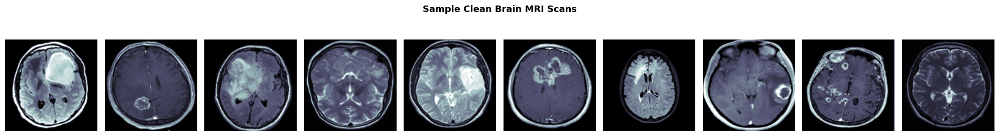

In [7]:
n = 10
np.random.seed(0)
idx = np.random.choice(len(X_train), n, replace=False)

plt.figure(figsize=(20, 3))
plt.suptitle("Sample Clean Brain MRI Scans", fontsize=13, fontweight='bold')
for i, j in enumerate(idx):
    ax = plt.subplot(1, n, i + 1)
    plt.imshow(X_train[j].squeeze(), cmap='bone', interpolation='bilinear')
    ax.set_axis_off()
plt.tight_layout()
plt.show()

## Adding Synthetic Noise

Real MRI noise comes from thermal motion in receiver coils and magnetic field inhomogeneities. We simulate this with Gaussian noise at three severity levels — so we can evaluate how the model holds up under mild, moderate, and heavy degradation.

The model trains on **moderate noise (σ=0.25)**. We'll test it against all three levels to see how well it generalizes.

In [8]:
def add_gaussian_noise(images, noise_factor, seed=None):
    """Add Gaussian noise and clip to [0, 1]. Seed for reproducibility."""
    rng = np.random.default_rng(seed)
    noisy = images + noise_factor * rng.standard_normal(size=images.shape)
    return np.clip(noisy, 0., 1.).astype('float32')

# Training uses moderate noise — fixed seed so results are reproducible
X_train_noisy = add_gaussian_noise(X_train, 0.25, seed=1)
X_test_noisy  = add_gaussian_noise(X_test,  0.25, seed=2)

# Evaluation at all three levels
X_test_mild   = add_gaussian_noise(X_test, 0.10, seed=3)
X_test_heavy  = add_gaussian_noise(X_test, 0.50, seed=4)

print("Noise datasets created.")
print(f"  Mild   (σ=0.10)  → {X_test_mild.shape}")
print(f"  Moderate (σ=0.25)→ {X_test_noisy.shape}")
print(f"  Heavy  (σ=0.50)  → {X_test_heavy.shape}")

Noise datasets created.
  Mild   (σ=0.10)  → (72, 128, 128, 1)
  Moderate (σ=0.25)→ (72, 128, 128, 1)
  Heavy  (σ=0.50)  → (72, 128, 128, 1)


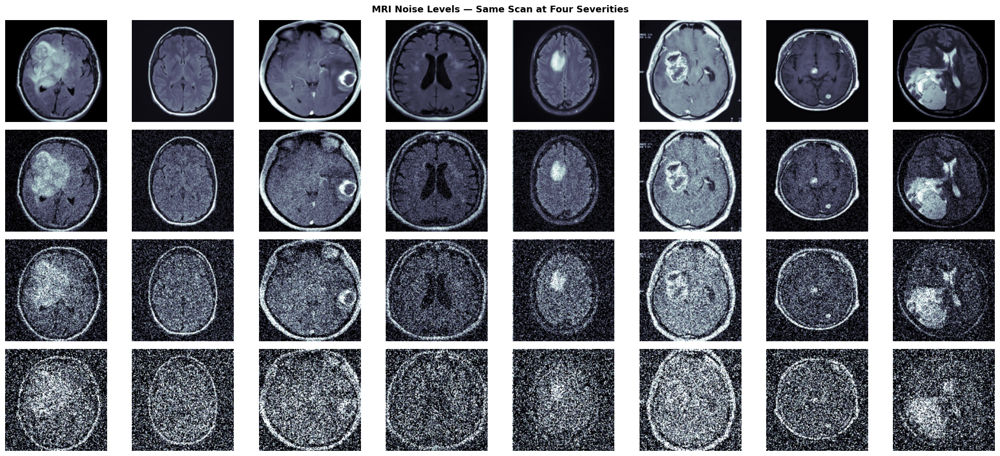

In [9]:
# Visualize all three noise levels on the same scans
np.random.seed(5)
idx = np.random.choice(len(X_test), 8, replace=False)

fig, axes = plt.subplots(4, 8, figsize=(20, 9))
fig.suptitle("MRI Noise Levels — Same Scan at Four Severities", fontsize=13, fontweight='bold')

label_rows = ["Clean", "Mild (σ=0.10)", "Moderate (σ=0.25)", "Heavy (σ=0.50)"]
data_rows  = [X_test, X_test_mild, X_test_noisy, X_test_heavy]

for row, (label, imgs) in enumerate(zip(label_rows, data_rows)):
    for col, j in enumerate(idx):
        axes[row, col].imshow(imgs[j].squeeze(), cmap='bone',
                              interpolation='bilinear', vmin=0, vmax=1)
        axes[row, col].set_axis_off()
    axes[row, 0].set_ylabel(label, fontsize=9, rotation=90, labelpad=45)

plt.tight_layout()
plt.show()

## Building the Denoising Autoencoder

This is a **U-Net-inspired** architecture — the gold standard for medical image-to-image tasks. Double conv blocks at each encoder/decoder level give the model more representational capacity at each resolution.

The bottleneck has **Dropout(0.3)** which acts as regularization — preventing the compressed representation from memorizing noise patterns.

```
Input (128×128×1)
    ↓ [Conv32 × 2] + BN  + Pool  →  64×64×32
    ↓ [Conv64 × 2] + BN  + Pool  →  32×32×64
    ↓ [Conv128 × 2] + BN + Pool  →  16×16×128
    ↓ [Conv256 × 2] + BN + Drop  →  16×16×256   ← bottleneck
    ↑ Up + [Conv128 × 2] + BN    →  32×32×128
    ↑ Up + [Conv64  × 2] + BN    →  64×64×64
    ↑ Up + [Conv32  × 2] + BN    →  128×128×32
    ↓ Conv(1, sigmoid)           →  128×128×1   ← clean output
```

In [10]:
K.clear_session()

def conv_block(x, filters, dropout_rate=0.0):
    """Two conv layers with BatchNorm + optional Dropout."""
    x = Conv2D(filters, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    x = Conv2D(filters, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    if dropout_rate > 0:
        x = Dropout(dropout_rate)(x)
    return x

def build_mri_denoiser(input_shape=(128, 128, 1)):
    x_in = Input(shape=input_shape, name="noisy_input")

    # ── Encoder ──────────────────────────────────────────────────────────────
    e1 = conv_block(x_in, 32)
    p1 = MaxPooling2D((2, 2))(e1)    # → 64×64

    e2 = conv_block(p1, 64)
    p2 = MaxPooling2D((2, 2))(e2)    # → 32×32

    e3 = conv_block(p2, 128)
    p3 = MaxPooling2D((2, 2))(e3)    # → 16×16

    # ── Bottleneck ───────────────────────────────────────────────────────────
    b = conv_block(p3, 256, dropout_rate=0.3)   # 16×16×256

    # ── Decoder ──────────────────────────────────────────────────────────────
    u3 = UpSampling2D((2, 2))(b)     # → 32×32
    d3 = conv_block(u3, 128)

    u2 = UpSampling2D((2, 2))(d3)    # → 64×64
    d2 = conv_block(u2, 64)

    u1 = UpSampling2D((2, 2))(d2)    # → 128×128
    d1 = conv_block(u1, 32)

    x_out = Conv2D(1, (1, 1), activation='sigmoid', name="clean_output")(d1)

    return Model(inputs=x_in, outputs=x_out, name="MRI_Denoising_AE")

mri_ae = build_mri_denoiser()
mri_ae.compile(optimizer='adam', loss='mse', metrics=['mae'])
mri_ae.summary()

Model: "MRI_Denoising_AE"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ noisy_input (InputLayer)        │ (None, 128, 128, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 128, 128, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 64, 64, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 32, 32, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 16, 16, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 16, 16, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 16, 16, 256)    │             

 Total params: 1,758,401 (6.71 MB)

 Trainable params: 1,755,585 (6.70 MB)

 Non-trainable params: 2,816 (11.00 KB)

## Training

Noisy images go in, clean images are the target. That one line — `fit(X_train_noisy, X_train, ...)` — is what makes this a denoising autoencoder rather than a standard one.

In [11]:
callbacks = [
    EarlyStopping(monitor='val_loss', patience=12,
                  restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                      patience=6, min_lr=1e-7, verbose=1)
]

history = mri_ae.fit(
    X_train_noisy, X_train,        # ← noisy in, clean target
    batch_size=16,
    epochs=100,
    validation_data=(X_test_noisy, X_test),
    callbacks=callbacks,
    verbose=1
)

Epoch 1/100
18/18 ━━━━━━━━━━━━━━━━━━━━ 48s 1s/step - loss: 0.1096 - mae: 0.2627 - val_loss: 0.0843 - val_mae: 0.2433 - learning_rate: 0.0010
Epoch 2/100
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.0369 - mae: 0.1439 - val_loss: 0.1570 - val_mae: 0.3458 - learning_rate: 0.0010
Epoch 3/100
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.0305 - mae: 0.1306 - val_loss: 0.1206 - val_mae: 0.2960 - learning_rate: 0.0010
Epoch 4/100
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.0265 - mae: 0.1201 - val_loss: 0.0655 - val_mae: 0.2116 - learning_rate: 0.0010
Epoch 5/100
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.0216 - mae: 0.1071 - val_loss: 0.0596 - val_mae: 0.1990 - learning_rate: 0.0010
Epoch 6/100
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.0179 - mae: 0.0973 - val_loss: 0.0598 - val_mae: 0.1969 - learning_rate: 0.0010
Epoch 7/100
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.0158 - mae: 0.0906 - val_loss: 0.0600 - val_mae: 0.1964 - learning_rate: 0.0010
Epoch 8

## Training Curves

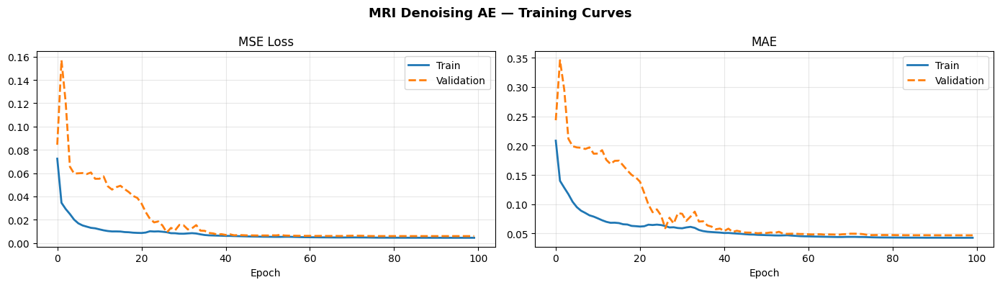

In [12]:
# Defensive key lookup — handles both 'mae' and 'mean_absolute_error'
# depending on TensorFlow version
mae_key     = [k for k in history.history if 'mae' in k and 'val' not in k][0]
val_mae_key = 'val_' + mae_key

fig, axes = plt.subplots(1, 2, figsize=(14, 4))
fig.suptitle("MRI Denoising AE — Training Curves", fontsize=13, fontweight='bold')

axes[0].plot(history.history['loss'],     label='Train',      linewidth=2)
axes[0].plot(history.history['val_loss'], label='Validation', linewidth=2, linestyle='--')
axes[0].set_title("MSE Loss"); axes[0].set_xlabel("Epoch")
axes[0].legend(); axes[0].grid(alpha=0.3)

axes[1].plot(history.history[mae_key],     label='Train',      linewidth=2)
axes[1].plot(history.history[val_mae_key], label='Validation', linewidth=2, linestyle='--')
axes[1].set_title("MAE"); axes[1].set_xlabel("Epoch")
axes[1].legend(); axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

## Denoising Results

Three rows: **Noisy input → Denoised output → Ground truth clean scan**.  
The closer the middle row looks to the bottom row, the better the model is performing.

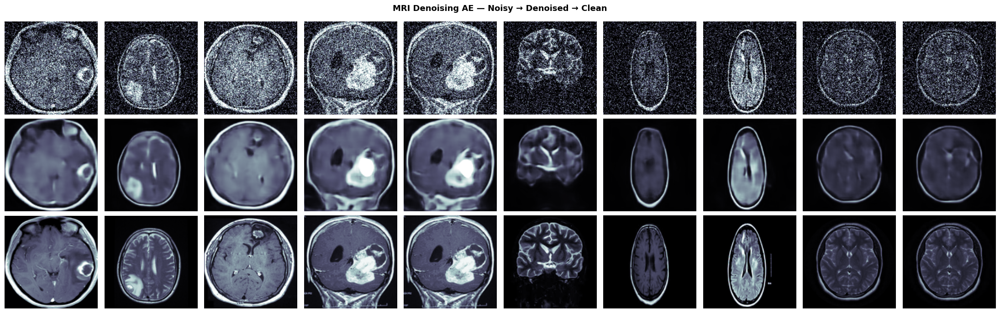

In [13]:
denoised = mri_ae.predict(X_test_noisy, verbose=0)

n = 10
np.random.seed(10)
idx = np.random.choice(len(X_test), n, replace=False)

fig, axes = plt.subplots(3, n, figsize=(22, 7))
fig.suptitle("MRI Denoising AE — Noisy → Denoised → Clean",
             fontsize=13, fontweight='bold')

row_labels = ["Noisy Input (σ=0.25)", "Denoised Output", "Ground Truth (Clean)"]
rows_data  = [X_test_noisy, denoised, X_test]

for row, (label, imgs) in enumerate(zip(row_labels, rows_data)):
    for col, j in enumerate(idx):
        axes[row, col].imshow(imgs[j].squeeze(), cmap='bone',
                              interpolation='bilinear', vmin=0, vmax=1)
        axes[row, col].set_axis_off()
    axes[row, 0].set_ylabel(label, fontsize=9, rotation=90, labelpad=50)

plt.tight_layout()
plt.show()

## Performance Across Noise Levels

The model trained on moderate noise (σ=0.25). Let's see how it handles mild and heavy noise it was never explicitly trained on — this tests whether it learned a *general* denoising principle or just memorized the training noise level.

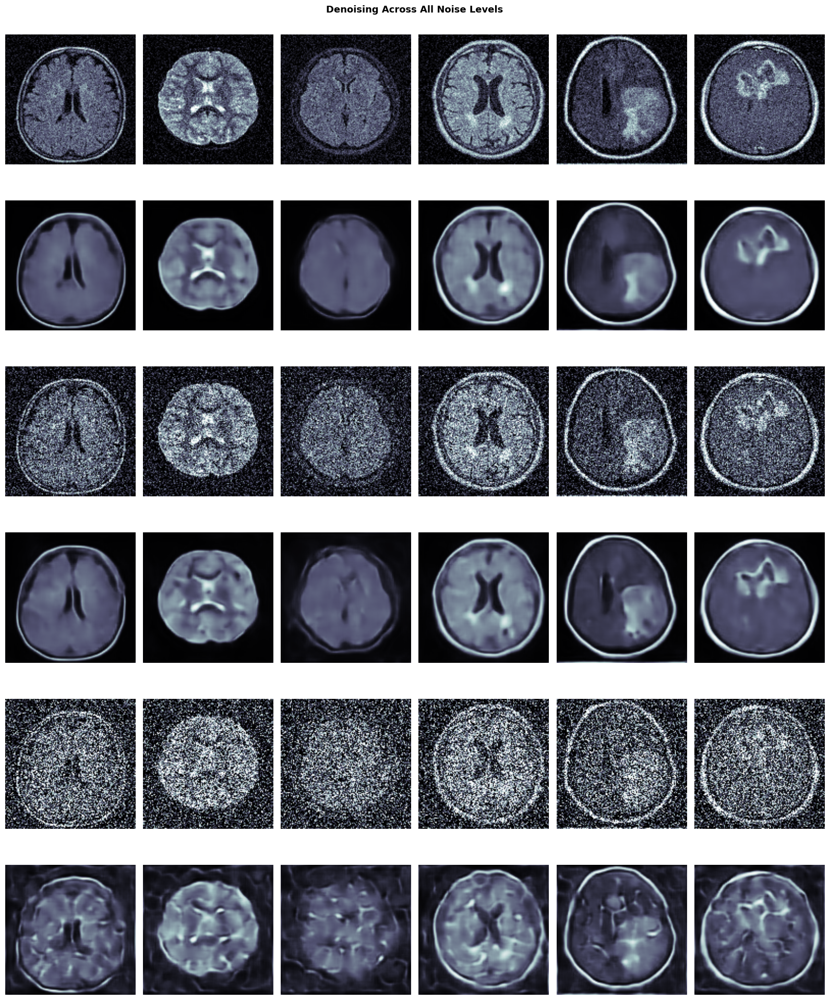

In [14]:
denoised_mild  = mri_ae.predict(X_test_mild,  verbose=0)
denoised_heavy = mri_ae.predict(X_test_heavy, verbose=0)

n = 6
np.random.seed(20)
idx = np.random.choice(len(X_test), n, replace=False)

fig, axes = plt.subplots(6, n, figsize=(16, 20))
fig.suptitle("Denoising Across All Noise Levels", fontsize=13, fontweight='bold')

levels = [
    ("Mild Noisy   (σ=0.10)", X_test_mild),
    ("Mild Denoised",         denoised_mild),
    ("Moderate Noisy (σ=0.25)",X_test_noisy),
    ("Moderate Denoised",     denoised),
    ("Heavy Noisy  (σ=0.50)", X_test_heavy),
    ("Heavy Denoised",        denoised_heavy),
]

for row, (label, imgs) in enumerate(levels):
    for col, j in enumerate(idx):
        axes[row, col].imshow(imgs[j].squeeze(), cmap='bone',
                              interpolation='bilinear', vmin=0, vmax=1)
        axes[row, col].set_axis_off()
    axes[row, 0].set_ylabel(label, fontsize=8, rotation=90, labelpad=55)

plt.tight_layout()
plt.show()

## Quantitative Evaluation — PSNR & SSIM

MSE is useful for training but doesn't map cleanly to perceptual quality. Two better metrics for medical imaging:

- **PSNR** (Peak Signal-to-Noise Ratio): higher is better, measured in dB. Good denoising typically achieves > 30 dB.
- **SSIM** (Structural Similarity Index): ranges 0–1. Measures structural, luminance, and contrast similarity — much closer to how humans perceive image quality.

In [15]:
def compute_metrics(clean, reconstructed):
    """Compute mean PSNR and SSIM across a batch."""
    psnr_scores, ssim_scores = [], []
    for i in range(len(clean)):
        c = clean[i].squeeze().astype('float64')
        r = np.clip(reconstructed[i].squeeze(), 0, 1).astype('float64')
        psnr_scores.append(psnr(c, r, data_range=1.0))
        ssim_scores.append(ssim(c, r, data_range=1.0))
    return np.mean(psnr_scores), np.mean(ssim_scores)

psnr_noisy,    ssim_noisy    = compute_metrics(X_test, X_test_noisy)
psnr_denoised, ssim_denoised = compute_metrics(X_test, denoised)
psnr_mild,     ssim_mild     = compute_metrics(X_test, denoised_mild)
psnr_heavy,    ssim_heavy    = compute_metrics(X_test, denoised_heavy)

print("=" * 55)
print(f"{'Condition':<28} {'PSNR (dB)':>10} {'SSIM':>10}")
print("=" * 55)
print(f"{'Noisy input (σ=0.25)':<28} {psnr_noisy:>10.2f} {ssim_noisy:>10.4f}")
print(f"{'Denoised (moderate)':<28} {psnr_denoised:>10.2f} {ssim_denoised:>10.4f}")
print(f"{'Denoised (mild input)':<28} {psnr_mild:>10.2f} {ssim_mild:>10.4f}")
print(f"{'Denoised (heavy input)':<28} {psnr_heavy:>10.2f} {ssim_heavy:>10.4f}")
print("=" * 55)
print(f"\nPSNR improvement (moderate): +{psnr_denoised - psnr_noisy:.2f} dB")
print(f"SSIM improvement (moderate): +{ssim_denoised - ssim_noisy:.4f}")

Condition                     PSNR (dB)       SSIM
Noisy input (σ=0.25)              13.79     0.2351
Denoised (moderate)               22.71     0.6104
Denoised (mild input)             22.36     0.6073
Denoised (heavy input)            17.56     0.3149

PSNR improvement (moderate): +8.92 dB
SSIM improvement (moderate): +0.3753


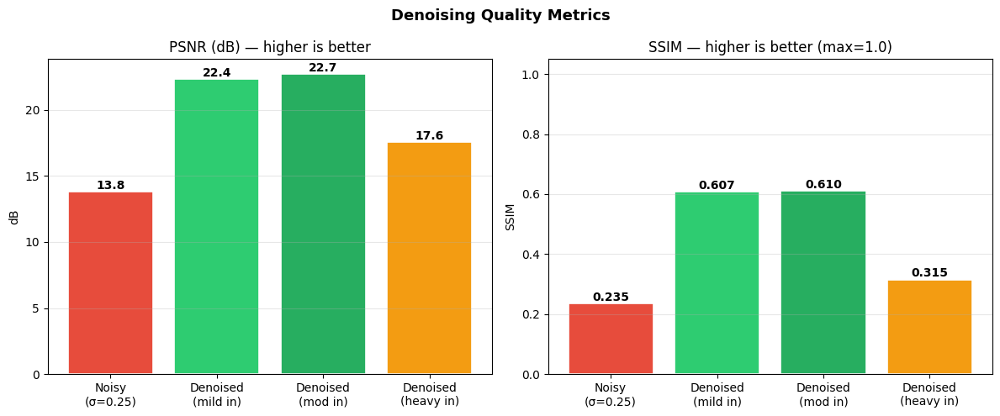

In [16]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
fig.suptitle("Denoising Quality Metrics", fontsize=13, fontweight='bold')

conditions    = ['Noisy\n(σ=0.25)', 'Denoised\n(mild in)', 'Denoised\n(mod in)', 'Denoised\n(heavy in)']
psnr_vals     = [psnr_noisy, psnr_mild, psnr_denoised, psnr_heavy]
ssim_vals     = [ssim_noisy, ssim_mild, ssim_denoised, ssim_heavy]
colors        = ['#e74c3c', '#2ecc71', '#27ae60', '#f39c12']

axes[0].bar(conditions, psnr_vals, color=colors, edgecolor='white', linewidth=1.2)
axes[0].set_title("PSNR (dB) — higher is better")
axes[0].set_ylabel("dB")
axes[0].grid(axis='y', alpha=0.3)
for i, v in enumerate(psnr_vals):
    axes[0].text(i, v + 0.2, f"{v:.1f}", ha='center', fontsize=10, fontweight='bold')

axes[1].bar(conditions, ssim_vals, color=colors, edgecolor='white', linewidth=1.2)
axes[1].set_title("SSIM — higher is better (max=1.0)")
axes[1].set_ylabel("SSIM")
axes[1].set_ylim(0, 1.05)
axes[1].grid(axis='y', alpha=0.3)
for i, v in enumerate(ssim_vals):
    axes[1].text(i, v + 0.01, f"{v:.3f}", ha='center', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()

## Residual Map — What Did the Model Remove?

The residual is the difference between noisy input and denoised output — essentially what the model decided was noise. In a well-trained denoiser this should look like random static with **no anatomical structure** visible. If you can see brain shapes in the residual, the model is over-smoothing and erasing real tissue detail.

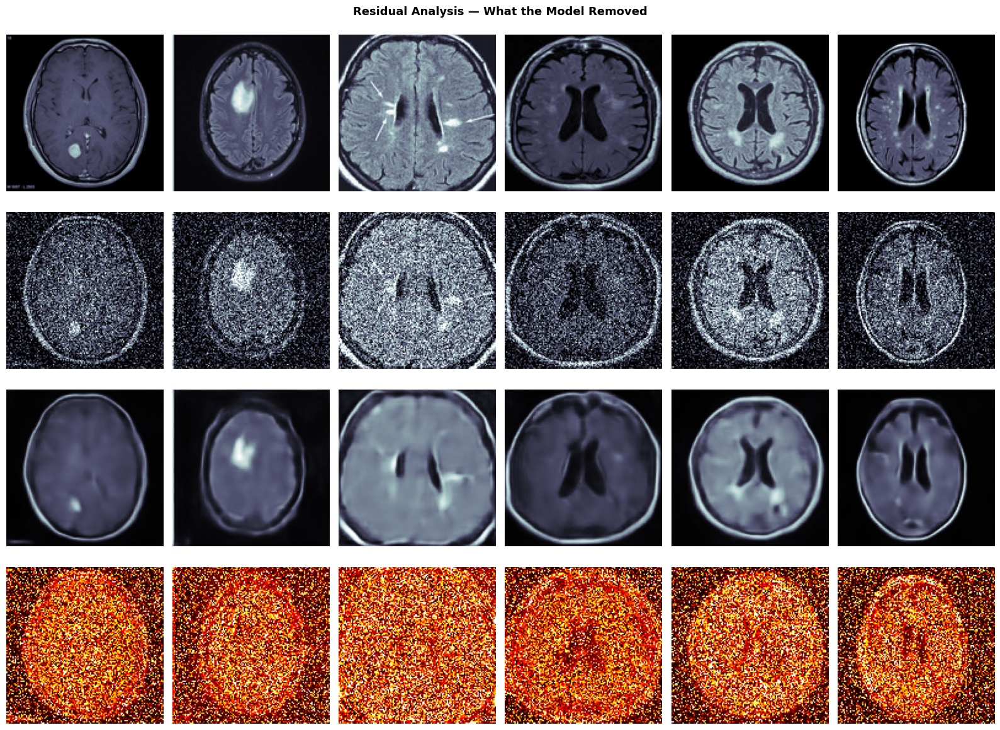

Interpretation:
  ✓ Good: residual looks like uniform static, no brain shapes visible
  ✗ Bad : residual shows brain outlines = model is over-smoothing


In [17]:
n = 6
np.random.seed(30)
idx = np.random.choice(len(X_test), n, replace=False)

fig, axes = plt.subplots(4, n, figsize=(16, 12))
fig.suptitle("Residual Analysis — What the Model Removed",
             fontsize=13, fontweight='bold')
row_labels = ["Clean", "Noisy Input", "Denoised", "Residual (Noisy − Denoised)"]

for col, j in enumerate(idx):
    residual = np.abs(X_test_noisy[j] - denoised[j])
    axes[0, col].imshow(X_test[j].squeeze(),       cmap='bone', vmin=0, vmax=1)
    axes[1, col].imshow(X_test_noisy[j].squeeze(), cmap='bone', vmin=0, vmax=1)
    axes[2, col].imshow(denoised[j].squeeze(),     cmap='bone', vmin=0, vmax=1)
    axes[3, col].imshow(residual.squeeze(),        cmap='hot',  vmin=0, vmax=0.4)
    for row in range(4):
        axes[row, col].set_axis_off()

for row, label in enumerate(row_labels):
    axes[row, 0].set_ylabel(label, fontsize=8, rotation=90, labelpad=55)

plt.tight_layout()
plt.show()

print("Interpretation:")
print("  ✓ Good: residual looks like uniform static, no brain shapes visible")
print("  ✗ Bad : residual shows brain outlines = model is over-smoothing")

## Summary

The denoising autoencoder learns to map noisy MRI scans back to their clean counterparts by building an internal model of what healthy brain anatomy looks like.

Key design choices that make this work:

- **Double conv blocks** at each encoder/decoder level — more capacity to capture fine anatomical details at each resolution
- **BatchNormalization** throughout — stabilizes training across the varying contrast levels typical in MRI
- **Dropout at the bottleneck** — prevents the compressed representation from routing noise through, acts as extra regularization
- **Reproducible noise seeds** — ensures evaluation results are consistent across runs
- **PSNR + SSIM** metrics — go beyond training loss to clinically meaningful quality measures
- **Residual maps** — provide interpretability, letting us verify the model removes noise without destroying real tissue signal

Real-world extensions of this exact architecture are deployed in clinical radiology to enhance low-dose MRI, reduce scan acquisition time, and improve diagnostic image quality.

In [20]:
# ── Install ───────────────────────────────────────────────────────────────────
!pip install streamlit pyngrok -q

import os
import numpy as np
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt

os.makedirs('/content/mri_app/figures', exist_ok=True)

# Save model
mri_ae.save('/content/mri_app/mri_denoiser.h5')
print("Model saved.")

# Fig 1: Clean Scans
np.random.seed(0)
idx = np.random.choice(len(X_train), 10, replace=False)
fig, axes = plt.subplots(1, 10, figsize=(20, 3))
fig.suptitle("Sample Clean Brain MRI Scans", fontsize=13, fontweight='bold')
for i, j in enumerate(idx):
    axes[i].imshow(X_train[j].squeeze(), cmap='bone', interpolation='bilinear')
    axes[i].set_axis_off()
plt.tight_layout()
plt.savefig('/content/mri_app/figures/fig1_clean_scans.png', dpi=120, bbox_inches='tight')
plt.close()
print("Fig 1 saved.")

# Fig 2: Noise Levels
np.random.seed(5)
idx = np.random.choice(len(X_test), 8, replace=False)
fig, axes = plt.subplots(4, 8, figsize=(20, 9))
fig.suptitle("MRI Noise Levels - Same Scan at Four Severities", fontsize=13, fontweight='bold')
label_rows = ["Clean", "Mild (s=0.10)", "Moderate (s=0.25)", "Heavy (s=0.50)"]
data_rows  = [X_test, X_test_mild, X_test_noisy, X_test_heavy]
for row, (label, imgs) in enumerate(zip(label_rows, data_rows)):
    for col, j in enumerate(idx):
        axes[row, col].imshow(imgs[j].squeeze(), cmap='bone', interpolation='bilinear', vmin=0, vmax=1)
        axes[row, col].set_axis_off()
    axes[row, 0].set_ylabel(label, fontsize=9, rotation=90, labelpad=45)
plt.tight_layout()
plt.savefig('/content/mri_app/figures/fig2_noise_levels.png', dpi=120, bbox_inches='tight')
plt.close()
print("Fig 2 saved.")

# Fig 3: Training Curves
mae_key     = [k for k in history.history if 'mae' in k and 'val' not in k][0]
val_mae_key = 'val_' + mae_key
fig, axes = plt.subplots(1, 2, figsize=(14, 4))
fig.suptitle("MRI Denoising AE - Training Curves", fontsize=13, fontweight='bold')
axes[0].plot(history.history['loss'],     label='Train',      linewidth=2)
axes[0].plot(history.history['val_loss'], label='Validation', linewidth=2, linestyle='--')
axes[0].set_title("MSE Loss"); axes[0].set_xlabel("Epoch")
axes[0].legend(); axes[0].grid(alpha=0.3)
axes[1].plot(history.history[mae_key],     label='Train',      linewidth=2)
axes[1].plot(history.history[val_mae_key], label='Validation', linewidth=2, linestyle='--')
axes[1].set_title("MAE"); axes[1].set_xlabel("Epoch")
axes[1].legend(); axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.savefig('/content/mri_app/figures/fig3_training_curves.png', dpi=120, bbox_inches='tight')
plt.close()
print("Fig 3 saved.")

# Fig 4: Main Denoising Results
denoised = mri_ae.predict(X_test_noisy, verbose=0)
np.random.seed(10)
idx = np.random.choice(len(X_test), 10, replace=False)
fig, axes = plt.subplots(3, 10, figsize=(22, 7))
fig.suptitle("MRI Denoising AE - Noisy to Denoised to Clean", fontsize=13, fontweight='bold')
row_labels = ["Noisy Input (s=0.25)", "Denoised Output", "Ground Truth (Clean)"]
rows_data  = [X_test_noisy, denoised, X_test]
for row, (label, imgs) in enumerate(zip(row_labels, rows_data)):
    for col, j in enumerate(idx):
        axes[row, col].imshow(imgs[j].squeeze(), cmap='bone', interpolation='bilinear', vmin=0, vmax=1)
        axes[row, col].set_axis_off()
    axes[row, 0].set_ylabel(label, fontsize=9, rotation=90, labelpad=50)
plt.tight_layout()
plt.savefig('/content/mri_app/figures/fig4_denoising_results.png', dpi=120, bbox_inches='tight')
plt.close()
print("Fig 4 saved.")

# Fig 5: All Noise Levels
denoised_mild  = mri_ae.predict(X_test_mild,  verbose=0)
denoised_heavy = mri_ae.predict(X_test_heavy, verbose=0)
np.random.seed(20)
idx = np.random.choice(len(X_test), 6, replace=False)
fig, axes = plt.subplots(6, 6, figsize=(16, 20))
fig.suptitle("Denoising Across All Noise Levels", fontsize=13, fontweight='bold')
levels = [
    ("Mild Noisy (s=0.10)",    X_test_mild),
    ("Mild Denoised",          denoised_mild),
    ("Moderate Noisy (s=0.25)",X_test_noisy),
    ("Moderate Denoised",      denoised),
    ("Heavy Noisy (s=0.50)",   X_test_heavy),
    ("Heavy Denoised",         denoised_heavy),
]
for row, (label, imgs) in enumerate(levels):
    for col, j in enumerate(idx):
        axes[row, col].imshow(imgs[j].squeeze(), cmap='bone', interpolation='bilinear', vmin=0, vmax=1)
        axes[row, col].set_axis_off()
    axes[row, 0].set_ylabel(label, fontsize=8, rotation=90, labelpad=55)
plt.tight_layout()
plt.savefig('/content/mri_app/figures/fig5_all_noise_levels.png', dpi=120, bbox_inches='tight')
plt.close()
print("Fig 5 saved.")

# Fig 6: Metrics Bar Chart
from skimage.metrics import peak_signal_noise_ratio as psnr_fn
from skimage.metrics import structural_similarity as ssim_fn

def compute_metrics(clean, recon):
    ps, ss = [], []
    for i in range(len(clean)):
        c = clean[i].squeeze().astype('float64')
        r = np.clip(recon[i].squeeze(), 0, 1).astype('float64')
        ps.append(psnr_fn(c, r, data_range=1.0))
        ss.append(ssim_fn(c, r, data_range=1.0))
    return np.mean(ps), np.mean(ss)

psnr_noisy,    ssim_noisy    = compute_metrics(X_test, X_test_noisy)
psnr_denoised, ssim_denoised = compute_metrics(X_test, denoised)
psnr_mild,     ssim_mild     = compute_metrics(X_test, denoised_mild)
psnr_heavy,    ssim_heavy    = compute_metrics(X_test, denoised_heavy)

np.save('/content/mri_app/figures/metrics.npy', {
    'psnr_noisy': psnr_noisy, 'ssim_noisy': ssim_noisy,
    'psnr_denoised': psnr_denoised, 'ssim_denoised': ssim_denoised,
    'psnr_mild': psnr_mild, 'ssim_mild': ssim_mild,
    'psnr_heavy': psnr_heavy, 'ssim_heavy': ssim_heavy,
})

conditions = ['Noisy\n(s=0.25)', 'Denoised\n(mild)', 'Denoised\n(moderate)', 'Denoised\n(heavy)']
psnr_vals  = [psnr_noisy, psnr_mild, psnr_denoised, psnr_heavy]
ssim_vals  = [ssim_noisy, ssim_mild, ssim_denoised, ssim_heavy]
colors     = ['#e74c3c', '#2ecc71', '#27ae60', '#f39c12']
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
fig.suptitle("Denoising Quality Metrics", fontsize=13, fontweight='bold')
axes[0].bar(conditions, psnr_vals, color=colors, edgecolor='white', linewidth=1.2)
axes[0].set_title("PSNR (dB) - higher is better"); axes[0].set_ylabel("dB")
axes[0].grid(axis='y', alpha=0.3)
for i, v in enumerate(psnr_vals):
    axes[0].text(i, v + 0.2, f"{v:.1f}", ha='center', fontsize=10, fontweight='bold')
axes[1].bar(conditions, ssim_vals, color=colors, edgecolor='white', linewidth=1.2)
axes[1].set_title("SSIM - higher is better (max=1.0)"); axes[1].set_ylabel("SSIM")
axes[1].set_ylim(0, 1.05); axes[1].grid(axis='y', alpha=0.3)
for i, v in enumerate(ssim_vals):
    axes[1].text(i, v + 0.01, f"{v:.3f}", ha='center', fontsize=10, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/mri_app/figures/fig6_metrics.png', dpi=120, bbox_inches='tight')
plt.close()
print("Fig 6 saved.")

# Fig 7: Residual Maps
np.random.seed(30)
idx = np.random.choice(len(X_test), 6, replace=False)
fig, axes = plt.subplots(4, 6, figsize=(16, 12))
fig.suptitle("Residual Analysis - What the Model Removed", fontsize=13, fontweight='bold')
row_labels = ["Clean", "Noisy Input", "Denoised", "Residual (Noisy - Denoised)"]
for col, j in enumerate(idx):
    residual = np.abs(X_test_noisy[j] - denoised[j])
    axes[0, col].imshow(X_test[j].squeeze(),       cmap='bone', vmin=0, vmax=1)
    axes[1, col].imshow(X_test_noisy[j].squeeze(), cmap='bone', vmin=0, vmax=1)
    axes[2, col].imshow(denoised[j].squeeze(),     cmap='bone', vmin=0, vmax=1)
    axes[3, col].imshow(residual.squeeze(),        cmap='hot',  vmin=0, vmax=0.4)
    for row in range(4):
        axes[row, col].set_axis_off()
for row, label in enumerate(row_labels):
    axes[row, 0].set_ylabel(label, fontsize=8, rotation=90, labelpad=55)
plt.tight_layout()
plt.savefig('/content/mri_app/figures/fig7_residual.png', dpi=120, bbox_inches='tight')
plt.close()
print("Fig 7 saved.")

print("\nAll figures saved. Ready to launch app.")

Model saved.
Fig 1 saved.
Fig 2 saved.
Fig 3 saved.
Fig 4 saved.
Fig 5 saved.
Fig 6 saved.
Fig 7 saved.

All figures saved. Ready to launch app.


In [21]:
import os
os.makedirs('/content/mri_app', exist_ok=True)

app_lines = [
    "import streamlit as st",
    "import numpy as np",
    "from PIL import Image",
    "import os",
    "",
    "st.set_page_config(page_title='Brain MRI Denoising - Project Showcase', page_icon='🧠', layout='wide')",
    "",
    "def show_fig(path, caption=''):",
    "    if os.path.exists(path):",
    "        st.image(path, caption=caption, use_column_width=True)",
    "    else:",
    "        st.warning(f'Figure not found: {path}')",
    "",
    "metrics = np.load('/content/mri_app/figures/metrics.npy', allow_pickle=True).item()",
    "",
    "st.sidebar.title('Navigation')",
    "st.sidebar.markdown('---')",
    "sections = ['🏠 Home','📖 Theory','🏗️ Architecture','📊 Dataset','🌧️ Noise Levels','📈 Training','✨ Denoising Results','📐 Metrics','🔍 Residual Analysis','📝 Summary']",
    "choice = st.sidebar.radio('Go to', sections)",
    "st.sidebar.markdown('---')",
    "st.sidebar.markdown('**Model:** Conv Denoising AE')",
    "st.sidebar.markdown('**Dataset:** Brain MRI (Kaggle)')",
    "st.sidebar.markdown('**Input:** 128x128 grayscale')",
    "st.sidebar.markdown('**Training noise:** sigma=0.25')",
    "",
    "if choice == '🏠 Home':",
    "    st.title('🧠 Brain MRI Denoising Autoencoder')",
    "    st.markdown('### A Deep Learning Project for Medical Image Enhancement')",
    "    st.divider()",
    "    c1,c2,c3,c4 = st.columns(4)",
    "    c1.metric('Architecture','Conv AE')",
    "    c2.metric('Dataset','Brain MRI')",
    "    c3.metric('Input Size','128x128')",
    "    c4.metric('Task','Denoising')",
    "    st.divider()",
    "    st.markdown('This project builds and trains a Convolutional Denoising Autoencoder on brain MRI scans. The model learns to remove noise from degraded images - a real problem in clinical radiology where noise can obscure important diagnostic features like tumors.')",
    "    st.divider()",
    "    st.subheader('Quick Preview')",
    "    show_fig('/content/mri_app/figures/fig4_denoising_results.png','Noisy Input | Denoised Output | Clean Ground Truth')",
    "",
    "elif choice == '📖 Theory':",
    "    st.title('📖 Theory - How Denoising Autoencoders Work')",
    "    st.divider()",
    "    st.markdown('## What is an Autoencoder?')",
    "    st.markdown('An autoencoder is a neural network trained to reproduce its own input. It has two parts: the Encoder which compresses the input into a small bottleneck representation, and the Decoder which reconstructs the original from that compressed form. The bottleneck forces the model to learn only the most essential features - it cannot memorize, it must find patterns.')",
    "    st.divider()",
    "    st.markdown('## What Makes it a Denoising Autoencoder?')",
    "    st.markdown('A standard autoencoder gets clean input and tries to reproduce clean output. A denoising autoencoder gets corrupted input but is still expected to produce clean output.')",
    "    st.code('model.fit(X_train_noisy, X_train)   # noisy in, clean target', language='python')",
    "    st.markdown('This forces the model to learn what a real brain scan looks like underneath the noise. It cannot take shortcuts - it has to understand anatomy.')",
    "    st.divider()",
    "    st.markdown('## Why Does This Work?')",
    "    st.markdown('Noise is random and unstructured - it has no consistent pattern across images. Brain anatomy IS consistent - the same structures appear across thousands of scans. When the bottleneck compresses the image, random noise gets squeezed out because it carries no repeatable information. Only structured, meaningful patterns survive compression.')",
    "    st.divider()",
    "    st.markdown('## Why Does This Matter in Medical Imaging?')",
    "    st.markdown('MRI noise can make small tumors look like artifacts, obscure tissue boundaries, and reduce diagnostic confidence. A denoising autoencoder enhances image quality without requiring a longer scan - directly reducing patient discomfort and scanner costs.')",
    "",
    "elif choice == '🏗️ Architecture':",
    "    st.title('🏗️ Model Architecture')",
    "    st.divider()",
    "    st.markdown('## U-Net Inspired Convolutional Autoencoder')",
    "    st.markdown('We use a deep convolutional architecture inspired by U-Net - the gold standard for medical image processing. Double conv blocks at each level, BatchNormalization throughout, and Dropout at the bottleneck.')",
    "    st.divider()",
    "    st.code('''Input (128x128x1)",
    "Encoder:",
    "  [Conv32 x2] + BN + MaxPool  ->  64x64x32",
    "  [Conv64 x2] + BN + MaxPool  ->  32x32x64",
    "  [Conv128 x2] + BN + MaxPool ->  16x16x128",
    "Bottleneck:",
    "  [Conv256 x2] + BN + Dropout ->  16x16x256",
    "Decoder:",
    "  UpSample + [Conv128 x2] + BN ->  32x32x128",
    "  UpSample + [Conv64 x2]  + BN ->  64x64x64",
    "  UpSample + [Conv32 x2]  + BN -> 128x128x32",
    "Output:",
    "  Conv(1, sigmoid)             -> 128x128x1''', language='text')",
    "    st.divider()",
    "    col1, col2 = st.columns(2)",
    "    with col1:",
    "        st.markdown('### Encoder')",
    "        st.markdown('Progressively compresses using Conv + MaxPooling. Each stage doubles filters while halving spatial size. Forces the model to learn increasingly abstract features.')",
    "    with col2:",
    "        st.markdown('### Decoder')",
    "        st.markdown('Mirrors the encoder using UpSampling. Reconstructs spatial resolution step by step. Final Conv with sigmoid outputs pixel values in [0,1].')",
    "    st.divider()",
    "    st.markdown('### Why Dropout at the Bottleneck?')",
    "    st.markdown('Dropout(0.3) randomly drops 30% of bottleneck neurons during training. This prevents the model from routing noise patterns through the compressed representation - it must learn clean anatomy, not memorize noise.')",
    "",
    "elif choice == '📊 Dataset':",
    "    st.title('📊 Dataset - Brain MRI Scans')",
    "    st.divider()",
    "    st.markdown('**Source:** Kaggle - Brain MRI Images for Brain Tumor Detection')",
    "    st.markdown('**Structure:** Two subfolders - yes/ (tumor present) and no/ (no tumor). We use ALL images and ignore labels since this is unsupervised denoising.')",
    "    st.markdown('**Split:** 80% training / 20% test (random_state=42)')",
    "    st.divider()",
    "    st.subheader('Sample Clean MRI Scans from the Dataset')",
    "    show_fig('/content/mri_app/figures/fig1_clean_scans.png')",
    "    st.caption('Original clean scans the model learns to reconstruct')",
    "    st.divider()",
    "    st.markdown('## Preprocessing Steps')",
    "    st.markdown('1. Load all JPG/PNG images recursively from yes/ and no/ subfolders')",
    "    st.markdown('2. Handle CMYK or unusual color modes by converting to RGB first')",
    "    st.markdown('3. Convert to grayscale - MRI is inherently single channel')",
    "    st.markdown('4. Resize to 128x128 using LANCZOS resampling')",
    "    st.markdown('5. Normalize pixel values to [0, 1] by dividing by 255')",
    "    st.markdown('6. Add channel dimension - final shape: (N, 128, 128, 1)')",
    "",
    "elif choice == '🌧️ Noise Levels':",
    "    st.title('🌧️ Noise Simulation')",
    "    st.divider()",
    "    st.markdown('## How Noise Was Added')",
    "    st.markdown('Real MRI noise comes from thermal motion in receiver coils and magnetic field inhomogeneities. We simulate this with additive Gaussian noise - the standard model for MRI noise.')",
    "    st.code('noisy = np.clip(clean + sigma * np.random.normal(size=clean.shape), 0, 1)', language='python')",
    "    st.markdown('Fixed random seeds ensure reproducible results across every run.')",
    "    st.divider()",
    "    c1,c2,c3 = st.columns(3)",
    "    c1.metric('Mild','sigma = 0.10','Barely noticeable')",
    "    c2.metric('Moderate','sigma = 0.25','Trained on this level')",
    "    c3.metric('Heavy','sigma = 0.50','Severely corrupted')",
    "    st.divider()",
    "    show_fig('/content/mri_app/figures/fig2_noise_levels.png')",
    "    st.caption('Same scans at all four severity levels - Clean, Mild, Moderate, Heavy')",
    "    st.divider()",
    "    st.markdown('**Training strategy:** The model only trained on moderate noise (sigma=0.25). We test it on mild and heavy noise to see if it learned a general denoising principle rather than memorizing one noise level.')",
    "",
    "elif choice == '📈 Training':",
    "    st.title('📈 Training')",
    "    st.divider()",
    "    st.markdown('## Training Setup')",
    "    col1, col2 = st.columns(2)",
    "    with col1:",
    "        st.markdown('**Optimizer:** Adam')",
    "        st.markdown('**Loss:** Mean Squared Error')",
    "        st.markdown('**Batch size:** 16')",
    "        st.markdown('**Max epochs:** 100')",
    "    with col2:",
    "        st.markdown('**EarlyStopping** - patience=12, restores best weights')",
    "        st.markdown('**ReduceLROnPlateau** - patience=6, factor=0.5')",
    "        st.markdown('**Min LR:** 1e-7')",
    "    st.divider()",
    "    st.markdown('**The key line that makes this a denoising autoencoder:**')",
    "    st.code('model.fit(X_train_noisy, X_train, ...)   # noisy in, clean target', language='python')",
    "    st.divider()",
    "    st.subheader('Training Curves')",
    "    show_fig('/content/mri_app/figures/fig3_training_curves.png')",
    "    st.caption('Left: MSE Loss | Right: MAE - both train and validation shown')",
    "    st.markdown('Both curves decreasing and plateauing together means the model generalized - it did not memorize.')",
    "",
    "elif choice == '✨ Denoising Results':",
    "    st.title('✨ Denoising Results')",
    "    st.divider()",
    "    st.subheader('Main Results - Moderate Noise (sigma=0.25)')",
    "    st.markdown('Three rows: **Noisy Input** | **Denoised Output** | **Ground Truth Clean**')",
    "    show_fig('/content/mri_app/figures/fig4_denoising_results.png')",
    "    st.divider()",
    "    st.subheader('Generalization Across All Noise Levels')",
    "    st.markdown('The model only trained on moderate noise. Here we test it against mild and heavy noise too.')",
    "    show_fig('/content/mri_app/figures/fig5_all_noise_levels.png')",
    "    st.caption('Rows alternate: Noisy then Denoised for each severity level')",
    "    st.divider()",
    "    st.markdown('**Key observation:** Tumor regions (bright blobs) remain visible after denoising - clinically important. The model removes noise without erasing real anatomy.')",
    "",
    "elif choice == '📐 Metrics':",
    "    st.title('📐 Quality Metrics - PSNR and SSIM')",
    "    st.divider()",
    "    st.markdown('**PSNR (Peak Signal-to-Noise Ratio):** Measured in dB, higher is better. Good denoising typically achieves above 30 dB.')",
    "    st.markdown('**SSIM (Structural Similarity Index):** Ranges 0 to 1. Closer to 1.0 means the denoised image is perceptually very close to the clean original.')",
    "    st.divider()",
    "    m1,m2,m3,m4 = st.columns(4)",
    "    m1.metric('PSNR - Noisy',   f\"{metrics['psnr_noisy']:.2f} dB\")",
    "    m2.metric('PSNR - Denoised',f\"{metrics['psnr_denoised']:.2f} dB\", delta=f\"+{metrics['psnr_denoised']-metrics['psnr_noisy']:.2f} dB\")",
    "    m3.metric('SSIM - Noisy',   f\"{metrics['ssim_noisy']:.3f}\")",
    "    m4.metric('SSIM - Denoised',f\"{metrics['ssim_denoised']:.3f}\", delta=f\"+{metrics['ssim_denoised']-metrics['ssim_noisy']:.3f}\")",
    "    st.divider()",
    "    show_fig('/content/mri_app/figures/fig6_metrics.png')",
    "    st.caption('PSNR and SSIM across noise levels. Green = denoised outputs.')",
    "",
    "elif choice == '🔍 Residual Analysis':",
    "    st.title('🔍 Residual Analysis')",
    "    st.divider()",
    "    st.markdown('## What Did the Model Actually Remove?')",
    "    st.markdown('Residual = absolute difference between noisy input and denoised output. Shows exactly what the model decided was noise.')",
    "    st.divider()",
    "    col1, col2 = st.columns(2)",
    "    with col1:",
    "        st.markdown('**Good sign:**')",
    "        st.markdown('- Residual looks like uniform random static')",
    "        st.markdown('- No brain structures visible in the residual')",
    "    with col2:",
    "        st.markdown('**Bad sign:**')",
    "        st.markdown('- Brain outlines visible in residual = over-smoothing')",
    "        st.markdown('- Blank residual = model doing nothing')",
    "    st.divider()",
    "    show_fig('/content/mri_app/figures/fig7_residual.png')",
    "    st.caption('Row 1: Clean | Row 2: Noisy | Row 3: Denoised | Row 4: Residual (hot colormap)')",
    "    st.divider()",
    "    st.markdown('Bright yellow/white in residual = large values removed (high noise). Dark = little removed (already clean). If residual shows brain shapes = over-smoothing.')",
    "",
    "elif choice == '📝 Summary':",
    "    st.title('📝 Summary')",
    "    st.divider()",
    "    st.markdown('## What Was Built')",
    "    st.markdown('A Convolutional Denoising Autoencoder trained on brain MRI scans. The model maps noisy scans back to clean versions by learning an internal representation of healthy brain anatomy.')",
    "    st.divider()",
    "    col1, col2 = st.columns(2)",
    "    with col1:",
    "        st.markdown('**Architecture**')",
    "        st.markdown('- Double conv blocks at each level')",
    "        st.markdown('- BatchNormalization throughout')",
    "        st.markdown('- Dropout(0.3) at bottleneck')",
    "        st.markdown('- UpSampling2D decoder')",
    "    with col2:",
    "        st.markdown('**Training**')",
    "        st.markdown('- Noisy input, clean target')",
    "        st.markdown('- EarlyStopping + ReduceLROnPlateau')",
    "        st.markdown('- Reproducible noise seeds')",
    "        st.markdown('- Tested on 3 noise levels')",
    "    st.divider()",
    "    m1,m2,m3,m4 = st.columns(4)",
    "    m1.metric('PSNR Improvement', f\"+{metrics['psnr_denoised']-metrics['psnr_noisy']:.2f} dB\")",
    "    m2.metric('SSIM Improvement', f\"+{metrics['ssim_denoised']-metrics['ssim_noisy']:.3f}\")",
    "    m3.metric('Final PSNR', f\"{metrics['psnr_denoised']:.2f} dB\")",
    "    m4.metric('Final SSIM', f\"{metrics['ssim_denoised']:.3f}\")",
    "    st.divider()",
    "    st.markdown('## Real-World Relevance')",
    "    st.markdown('This exact approach is used in clinical radiology to enhance low-dose MRI scans, reduce scan time, and improve diagnostic image quality for radiologists.')",
    "    st.divider()",
    "    show_fig('/content/mri_app/figures/fig4_denoising_results.png','Final Results: Noisy | Denoised | Clean')",
]

with open('/content/mri_app/app.py', 'w') as f:
    f.write('\n'.join(app_lines))
print("app.py written.")

# Launch
from pyngrok import ngrok
import subprocess, time

# Paste your free token from https://dashboard.ngrok.com
NGROK_TOKEN = "3A41dK9hwacEsiRdS7zQQFqR5lv_21mcTA7kVmbVX5FeoCwv1"

ngrok.set_auth_token(NGROK_TOKEN)
os.system("pkill -f streamlit")
os.system("pkill -f ngrok")
time.sleep(2)

subprocess.Popen(
    ["streamlit", "run", "/content/mri_app/app.py",
     "--server.port", "8501",
     "--server.headless", "true",
     "--server.enableCORS", "false",
     "--server.enableXsrfProtection", "false"],
    stdout=subprocess.DEVNULL,
    stderr=subprocess.DEVNULL
)
time.sleep(4)

public_url = ngrok.connect(8501)
print("=" * 50)
print(f"  App is LIVE at: {public_url}")
print("=" * 50)
print("Keep this cell running.")

app.py written.
  App is LIVE at: NgrokTunnel: "https://regina-uncorseted-nonspuriously.ngrok-free.dev" -> "http://localhost:8501"
Keep this cell running.
